### Examine weighted spatial fetalization and all disease DEGs for the Kuppe dataset, and then calculate proportion of fetalization spots and Moran's I 

- Does processing specifically for the format of Kuppe dataset

The authors already performed `cell2location`, so we will use the fetal + disease up DEGs (fetal reactivation genes) to calculate a cell-type specific activity score and then multiply it by the cell type proportion

In [1]:
import scanpy as sc 
import numpy as np
import pandas as pd
import seaborn as sns
import random
import os
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
from libpysal.weights import KNN
from esda.moran import Moran
from scipy.stats import mannwhitneyu

In [2]:
def rename_adata_col(adata, cell_cols = ['Adipocyte', 'Cardiomyocyte', 'Endothelial', 'Fibroblast',
        'Lymphoid', 'Mast', 'Myeloid', 'Neuronal', 'Pericyte', 'Cycling.cells', 'vSMC'], tol=1e-6):

    '''Rename cell types for consistency'''
    adata.obs = adata.obs.rename(columns = {'vSMCs': 'vSMC'})

    # check all columns exist
    missing = [c for c in cell_cols if c not in adata.obs.columns]
    if len(missing) > 0:
        raise ValueError(f"Missing cell proportion columns: {missing}")
    
    # compute total proportion
    adata.obs['total_prop'] = adata.obs[cell_cols].sum(axis=1)
    
    # merge cycling into myeloid after total_prop is computed
    adata.obs['Myeloid'] = adata.obs['Myeloid'] + adata.obs['Cycling.cells']
    
    # check that proportions are 1
    not_one = ~np.isclose(adata.obs['total_prop'], 1.0, atol=tol)
    
    if not_one.any():
        print(f"{not_one.sum()} / {adata.n_obs} spots do NOT sum to 1")
        print("Summary of total_prop:")
        print(adata.obs['total_prop'].describe())
    else:
        print("All spot proportions sum to 1.")
    
    return adata

In [3]:
def identify_significant_up_DEGs(deseq2_results_path, foldchange_threshold = 0.5):
    '''Extract the significant DEGs'''
    deseq2_results_df = pd.read_csv(deseq2_results_path, index_col = 0)
    sig_genes =  deseq2_results_df.loc[(deseq2_results_df['significant'] == True) & 
        (deseq2_results_df['log2FoldChange'] > foldchange_threshold), ]
    sig_genes_list = list(sig_genes.index)
    return(sig_genes_list)

In [4]:
def cell_type_specific_load_fetalization_up_genes(cell_type, fetalization_df):
    '''Extract the significant DEGs'''
    cell_type_fetalization_df = fetalization_df[fetalization_df['cell_type'] == cell_type]
    cell_type_fetalization_genes = list(cell_type_fetalization_df['gene'])
    return(cell_type_fetalization_genes)

In [5]:
def obtain_score(adata, gene_list, score_name):
    '''Calculate the gene score for a list of fetalization genes'''
    present_genes = [g for g in gene_list if g in adata.var_names]
    sc.tl.score_genes(adata, present_genes, score_name=score_name)
    return(adata)

In [6]:
def visualize_score(adata, score_name, vmax=1, vmin=-1):
    '''Visualize a spatial score with a diverging colormap centered at 0'''
    scores = adata.obs[score_name].values
    fig, ax = plt.subplots()
    with plt.rc_context():
        sc.pl.spatial(adata, color=score_name, img_key="hires",
            spot_size=0.0175, size=1.3, cmap="RdBu_r",        
            vmin=vmin, vmax=vmax, alpha_img=0.6,
            edges_width=0.01, title=f"{score_name}",
            ax=ax, show=False)

    return fig

In [14]:
# dir with adata
adata_list_dir = "../processed_data/"

# specify directory with fetalization genes
fetalization_gene_dir = "../../../../aggregated_analysis/v3_pseudobulked_analysis/intersection_analysis/fetalization_genes/" 
disease_genes_dir = "../../../../aggregated_analysis/v3_pseudobulked_analysis/disease_DEG_analysis/binarized/pydeseq2_results/"
#cell_type_specific_fetalization_df = pd.read_csv("../../../../aggregated_analysis/v3_pseudobulked_analysis/intersection_analysis/03E_cell_type_specific_UP_fetalization_genes.csv", index_col = 0)

# remove hemoglobin (likely ambient from RBCs)
high_prevalence_gene_list = ['HBA1', 'HBA2', 'HBB']

In [15]:
adata_files = [f for f in os.listdir(adata_list_dir) if f.endswith(".h5ad") and ".ipynb_checkpoints" not in f]
adata_sample_names = [adata.replace(".h5ad", "") for adata in adata_files]

#### Examine only the more common cell types that have `cell2location` values already, and which display the fetalization signature (exclude Mast cells and Adipocytes)

In [16]:
cell_types = ["Cardiomyocyte", "Endothelial", "Fibroblast", "Myeloid", "Lymphoid", "Neuronal", "Pericyte", "vSMC"]

#### Create directory to save plots

In [17]:
adata_fetalization_dir = "adata_with_weighted_fetalization_scores/"
os.makedirs(adata_fetalization_dir, exist_ok=True)

### Test for one sample

In [18]:
adata = sc.read_h5ad("../processed_data/Visium_IZ_P16.h5ad")
adata = rename_adata_col(adata)
sc.pp.normalize_total(adata, target_sum=1e4)

All spot proportions sum to 1.


In [19]:
#adata.X.sum(axis = 1)

In [20]:
direction = "up" 

for cell_type in cell_types:
    fetalization_score_name = cell_type + " fetalization: " + direction
    fetalization_gene_path = fetalization_gene_dir + cell_type + "_" + direction + "_fetalization_genes.csv" 
    df = pd.read_csv(fetalization_gene_path)
    fetalization_gene_list = list(df['0'])
    fetalization_gene_list = list(set(fetalization_gene_list) - set(high_prevalence_gene_list))
    adata = obtain_score(adata, gene_list = fetalization_gene_list, score_name = fetalization_score_name)

    # disease score
    disease_gene_path = ( disease_genes_dir + cell_type + "_disease_binary_Y_vs_N_results.csv")
    disease_gene_list = identify_significant_up_DEGs(disease_gene_path)
    disease_gene_list = list(set(disease_gene_list) - set(high_prevalence_gene_list))
    
    # non-fetal disease score
    non_fetal_disease_genes = sorted( set(disease_gene_list) - set(fetalization_gene_list))
    non_fetal_disease_score_name = f"{cell_type} non-fetal disease: {direction}"
    adata = obtain_score(adata, gene_list=non_fetal_disease_genes, 
                                      score_name=non_fetal_disease_score_name)


# get sum of the products of each cell type and its corresponding fetalization value
total_fetalization = sum(adata.obs[ct] * adata.obs[f"{ct} fetalization: {direction}"] for ct in cell_types)
adata.obs['total_fetalization'] = total_fetalization

# get sum of the products of each cell type and its corresponding fetalization value
total_non_fetal_disease = sum(adata.obs[ct] * adata.obs[f"{ct} non-fetal disease: {direction}"] for ct in cell_types)
adata.obs['total_non_fetalization'] = total_non_fetal_disease

### Iterate through all cell types and all samples

Visium_IZ_P10
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_control_P1
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_BZ_P3
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_P11
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_control_P8
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_BZ_P12
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl

Visium_IZ_P15
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_GT_IZ_P13
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_FZ_P20
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_IZ_P3
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_control_P7
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_FZ_P5
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_FZ_P18
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_P6
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_control_P17
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_GT_P2
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_BZ_P2
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_IZ_BZ_P2
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_P3
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_GT_IZ_P9
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_FZ_GT_P19
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_FZ_P14
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_GT_IZ_P9_rep2
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_IZ_P16
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_FZ_GT_P4
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_RZ_P9
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


Visium_GT_IZ_P15
All spot proportions sum to 1.


/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",
/mnt/data1/william/tmp/ipykernel_1182309/482224706.py:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=score_name, img_key="hires",


CPU times: user 3min 17s, sys: 47.5 s, total: 4min 4s
Wall time: 3min 45s


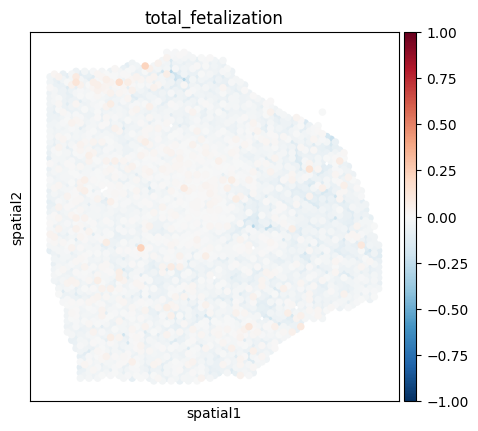

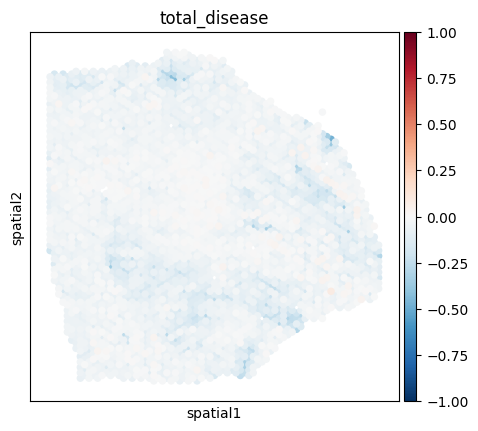

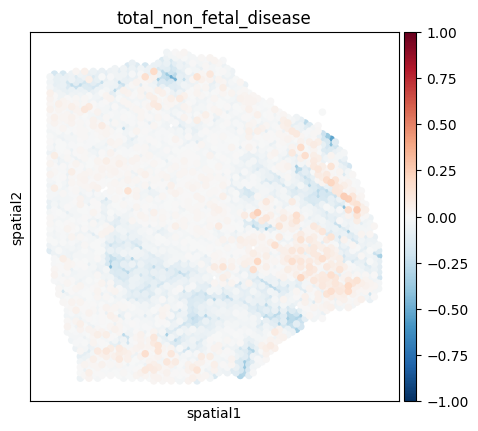

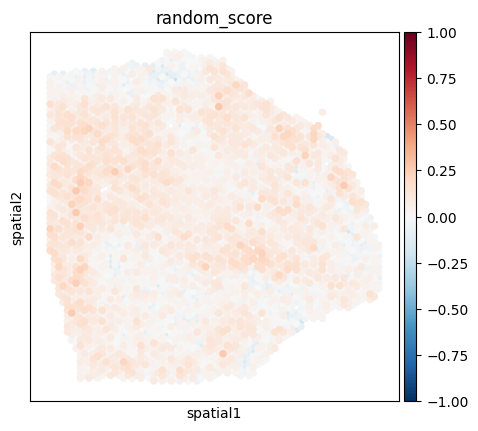

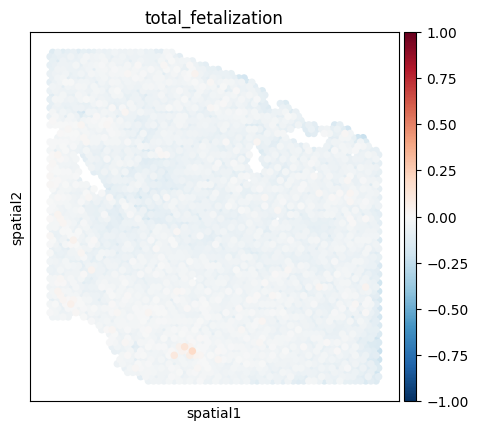

...

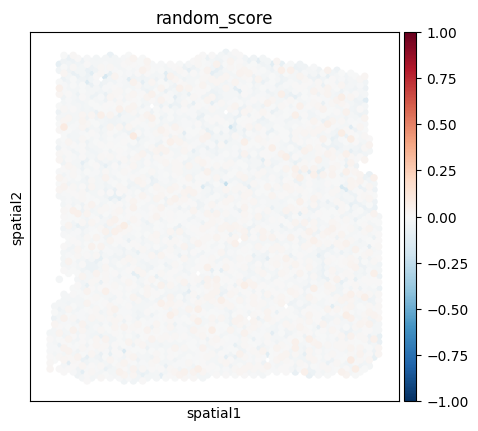

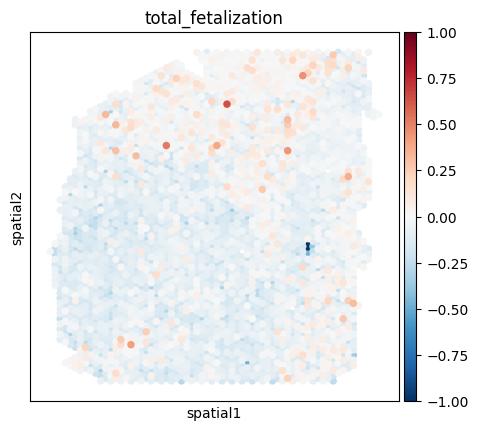

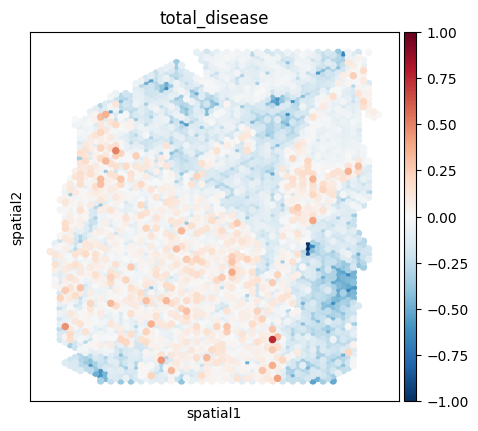

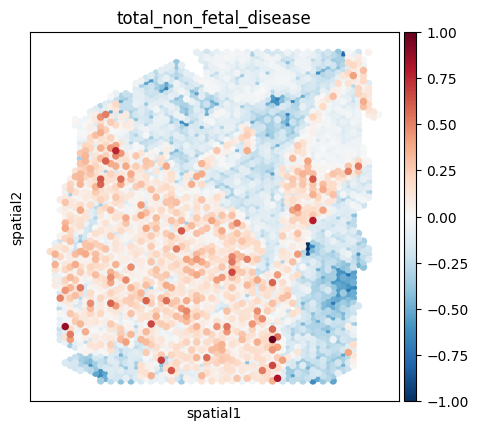

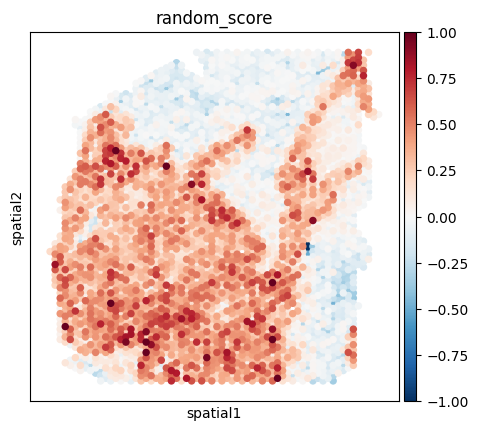

In [21]:
%%time

plots_dir = adata_fetalization_dir + "plots/"
os.makedirs(plots_dir, exist_ok=True)

direction = "up"

# define total score names
total_fetalization_score = "total_fetalization"
total_disease_score = "total_disease"
total_non_fetal_disease_score = "total_non_fetal_disease"
random_fetalization_score = "random_score"

for adata_sample, adata_file in zip(adata_sample_names, adata_files):

    print(adata_sample, flush=True)
    adata = sc.read_h5ad(adata_list_dir + adata_file)
    adata = rename_adata_col(adata)

    # cell type specific scores
    for cell_type in cell_types:

        # fetalization score
        fetalization_score_name = f"{cell_type} fetalization: {direction}"
        #fetalization_gene_list = load_fetalization_up_genes(fetalization_df = cell_type_specific_fetalization_df, cell_type = cell_type)
        fetalization_gene_path = (fetalization_gene_dir + cell_type + "_" + direction + "_fetalization_genes.csv")
        df = pd.read_csv(fetalization_gene_path)
        fetalization_gene_list = list(df["0"])
        fetalization_gene_list = list(set(fetalization_gene_list) - set(high_prevalence_gene_list))
        adata = obtain_score(adata, gene_list=fetalization_gene_list, score_name=fetalization_score_name)

        # disease score
        disease_gene_path = ( disease_genes_dir + cell_type + "_disease_binary_Y_vs_N_results.csv")
        disease_gene_list = identify_significant_up_DEGs(disease_gene_path)
        disease_gene_list = list(set(disease_gene_list) - set(high_prevalence_gene_list))
        disease_score_name = f"{cell_type} disease: {direction}"
        adata = obtain_score(adata, gene_list=disease_gene_list, score_name=disease_score_name)

        # non-fetal disease score
        non_fetal_disease_genes = sorted( set(disease_gene_list) - set(fetalization_gene_list))
        non_fetal_disease_score_name = f"{cell_type} non-fetal disease: {direction}"
        adata = obtain_score(adata, gene_list=non_fetal_disease_genes, 
                                          score_name=non_fetal_disease_score_name)

        # random gene set, but same size as fetalization)
        random_features = np.random.choice(adata.var["features"], size=len(fetalization_gene_list), replace=False,)
        random_score_name = f"{cell_type} random: {direction}"
        adata = obtain_score(adata, gene_list=random_features, score_name=random_score_name,)

    # get cell-type weighted scores
    adata.obs[total_fetalization_score] = sum(adata.obs[ct] * adata.obs[f"{ct} fetalization: {direction}"] for ct in cell_types)
    adata.obs[total_disease_score] = sum(adata.obs[ct] * adata.obs[f"{ct} disease: {direction}"] for ct in cell_types)
    adata.obs[total_non_fetal_disease_score] = sum(adata.obs[ct] * adata.obs[f"{ct} non-fetal disease: {direction}"] for ct in cell_types)
    adata.obs[random_fetalization_score] = sum(adata.obs[ct] * adata.obs[f"{ct} random: {direction}"] for ct in cell_types)

    # plots
    spatial_fetalization_plot = visualize_score(adata, score_name=total_fetalization_score)
    spatial_fetalization_plot.savefig(plots_dir + adata_sample + "_actual_fetalization_spatial_plot.pdf")

    spatial_disease_plot = visualize_score(adata, score_name=total_disease_score)
    spatial_disease_plot.savefig(plots_dir + adata_sample + "_actual_disease_spatial_plot.pdf")

    spatial_non_fetal_disease_plot = visualize_score(adata, score_name=total_non_fetal_disease_score)
    spatial_non_fetal_disease_plot.savefig(plots_dir + adata_sample + "_non_fetal_disease_spatial_plot.pdf")

    random_spatial_plot = visualize_score(adata, score_name=random_fetalization_score)
    random_spatial_plot.savefig(plots_dir + adata_sample + "_RANDOM_fetalization_spatial_plot.pdf")

    # save adata with scores
    adata.write(adata_fetalization_dir + adata_sample + ".h5ad")

### Calculate proportion of fetalization spots and Moran's I

In [22]:
def calculate_fetalization_prop_and_Moran(adata, fetalization_score_name, fetalization_threshold = 0): 

    # get the spatial coordinates
    coords = adata.obsm["X_spatial"]
    w = KNN.from_array(coords, k=6)
    proportional_fetalization_spots = sum(adata.obs[fetalization_score_name] > fetalization_threshold) / adata.obs.shape[0]
    # row-standardization
    w.transform = "R" 
    fetal_score = adata.obs[fetalization_score_name].values
    moran_fetal = Moran(fetal_score, w)

    fetal_I = moran_fetal.I
    fetal_p = moran_fetal.p_norm

    return(proportional_fetalization_spots, fetal_I, fetal_p)

In [23]:
results_list = []

for adata_sample, adata_file in zip(adata_sample_names, adata_files):
    
    adata = sc.read_h5ad(adata_fetalization_dir + adata_file)
    prop_fetalization, fetal_Moran, fetal_Moran_p = calculate_fetalization_prop_and_Moran(adata, 
                                                                                          fetalization_score_name = total_fetalization_score)

    # append results to list
    results_list.append({
        "sample": adata_sample,
        "prop_fetalization_spots": prop_fetalization,
        "fetal_Moran": fetal_Moran,
        "fetal_Moran_p": fetal_Moran_p
    })

# convert list to df
results_df = pd.DataFrame(results_list)

/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/libpysal/weights/distance.py:153: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  W.__init__(self, neighbors, id_order=ids, **kwargs)


### Visualize results

In [24]:
# extract the region
results_df[["region"]] = results_df["sample"].str.extract(r"^[^_]+_(.+)_[^_]+$")
# manually edit one example where "GT_IZ_P9" is kept
results_df.loc[results_df['region'] == "GT_IZ_P9", 'region'] = "GT_IZ"
results_df['prop_fetalization_spots'] =results_df['prop_fetalization_spots'] * 100

In [25]:
results_df.head()

,sample,prop_fetalization_spots,fetal_Moran,fetal_Moran_p,region
0,Visium_IZ_P10,15.798135,0.204509,7.597754e-103,IZ
1,Visium_control_P1,2.834387,0.322217,9.148071e-295,control
2,Visium_RZ_BZ_P3,0.665379,0.373591,0.000000e+00,RZ_BZ
3,Visium_RZ_P11,2.529762,0.292307,3.929178e-117,RZ
4,Visium_control_P8,0.407166,0.274592,3.686843e-125,control


Text(0, 0.5, 'Proportion')

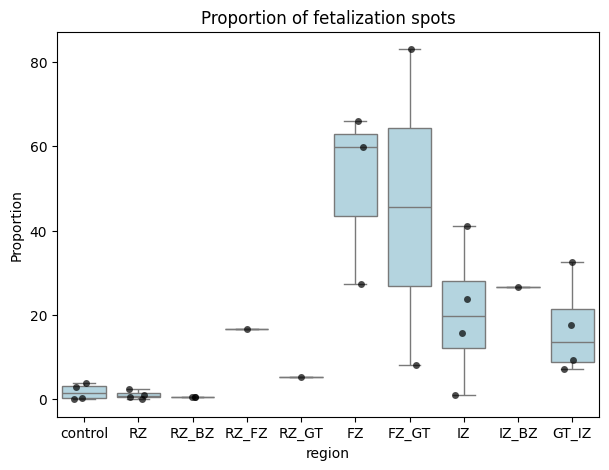

In [26]:
desired_order = ["control", "RZ", "RZ_BZ", "RZ_FZ", "RZ_GT", "FZ", "FZ_GT", "IZ", "IZ_BZ", "GT_IZ"]
plt.figure(figsize = (7, 5))
sns.boxplot(data = results_df, x = 'region', y = 'prop_fetalization_spots', color = 'lightblue', order=desired_order)
sns.stripplot(data = results_df, x='region', y='prop_fetalization_spots', color='black', order=desired_order, 
              jitter=0.2, size=5, alpha=0.7)
plt.title("Proportion of fetalization spots")
plt.xlabel("region")
plt.ylabel("Proportion")

In [27]:
results_df[results_df['prop_fetalization_spots'] > 5]

,sample,prop_fetalization_spots,fetal_Moran,fetal_Moran_p,region
0,Visium_IZ_P10,15.798135,0.204509,7.597754e-103,IZ
6,Visium_IZ_P15,40.999027,0.291024,2.227866e-175,IZ
7,Visium_GT_IZ_P13,32.592593,0.322616,5.221674e-135,GT_IZ
8,Visium_FZ_P20,59.751037,0.523373,0.000000e+00,FZ
11,Visium_RZ_FZ_P5,16.677482,0.456737,0.000000e+00,RZ_FZ
12,Visium_FZ_P18,65.974128,0.571519,0.000000e+00,FZ
15,Visium_RZ_GT_P2,5.370266,0.183886,1.979145e-81,RZ_GT
17,Visium_IZ_BZ_P2,26.623840,0.530533,0.000000e+00,IZ_BZ
19,Visium_GT_IZ_P9,7.108461,0.482862,0.000000e+00,GT_IZ
20,Visium_FZ_GT_P19,82.967742,0.388071,0.000000e+00,FZ_GT


Text(0, 0.5, 'Moran I for fetalization genes')

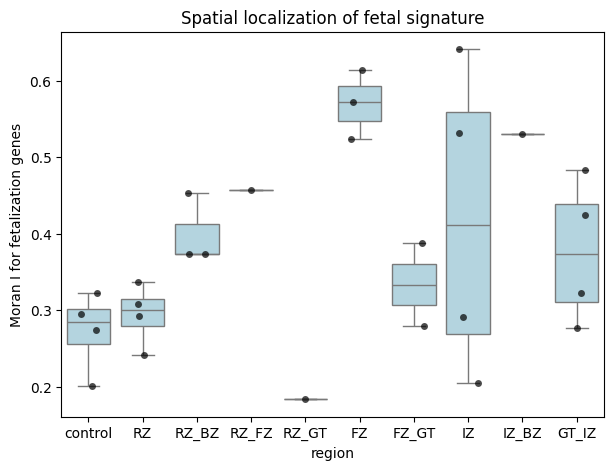

In [28]:
desired_order = ["control", "RZ", "RZ_BZ", "RZ_FZ", "RZ_GT", "FZ", "FZ_GT", "IZ", "IZ_BZ", "GT_IZ"]
plt.figure(figsize = (7, 5))
sns.boxplot(data = results_df, x = 'region', y = 'fetal_Moran', color = 'lightblue', order=desired_order)
sns.stripplot(data = results_df, x='region', y='fetal_Moran', color='black', order=desired_order, 
              jitter=0.2, size=5, alpha=0.7)
plt.title("Spatial localization of fetal signature")
plt.xlabel("region")
plt.ylabel("Moran I for fetalization genes")

### Calculate statistical significance

In [29]:
ND_regions = ["control", "RZ", "RZ_BZ", "RZ_FZ", "RZ_GT"]
D_regions = ["FZ", "FZ_GT", "IZ", "IZ_BZ", "GT_IZ"]

ND_values = results_df[results_df["region"].isin(ND_regions)]["fetal_Moran"]
D_values = results_df[results_df["region"].isin(D_regions)]["fetal_Moran"]

stat, p_value = mannwhitneyu(ND_values, D_values, alternative="two-sided") 

print(f"p value is: {p_value}")

p value is: 0.0347819484147747


In [30]:
ND_regions = ["control", "RZ", "RZ_BZ", "RZ_FZ", "RZ_GT"]
D_regions = ["FZ", "FZ_GT", "IZ", "IZ_BZ", "GT_IZ"]

ND_values = results_df[results_df["region"].isin(ND_regions)]["prop_fetalization_spots"]
D_values = results_df[results_df["region"].isin(D_regions)]["prop_fetalization_spots"]

stat, p_value = mannwhitneyu(ND_values, D_values, alternative="two-sided") 

print(f"p value is: {p_value}")

p value is: 9.369852852119804e-05


### Save results df

In [31]:
results_df.to_csv("Kuppe_Moran_I_results.csv")